# Investigate simulations with individual soil column per pft  

Inlcuding regridding

(c) Inne Vanderkelen - October 2023

## 1. Settings

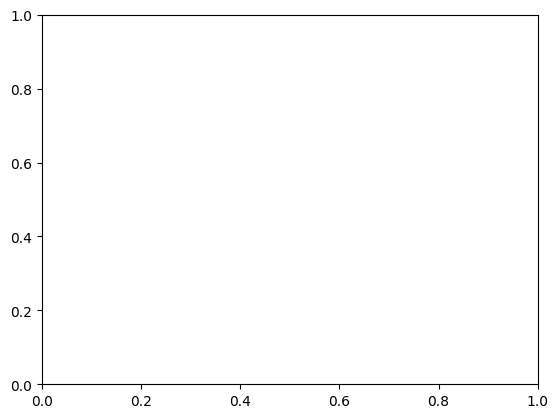

In [1]:
# laod modules 
import xarray as xr
import matplotlib.pyplot as plt
import os
import regionmask 
import pandas as pd

# import own utils module
from iv_utils_daint import *
from ctsm_py.utils import * #info on ctsm utils: https://github.com/NCAR/ctsm_python_gallery 
import matplotlib.patheffects as pe

# do plotting settings
set_plot_param()

# ignore all runtime warnings
warnings.filterwarnings('ignore')

In [2]:
# directory settings

# set directories
outdir = '/scratch/snx3000/ivanderk/'

# Define directory where processing is done 
procdir =  outdir + 'processing_4p1000/' 

# go to processing directory 
os.chdir(procdir)

In [3]:
# case settings

# define scenario
scenario = '4p1000'

# case settings
case_ctl = 'IHistClm51Sp.hcru_hcru_mt13.pftsoilcol.CTL.spunup2.nophs'
case_scen = 'IHistClm51Sp.hcru_hcru_mt13.pftsoilcol.'+scenario+'.spunup2.nophs'

case   = case_ctl
block  = 'lnd' 
stream = 'h1' 

# List of variables to import from file(s) in $indir matching $pattern.
variables = ['H2OSOI',"TOTSOILLIQ","TOTSOILICE", "QINFL" , "QOVER", "QDRAI", 'EFLX_LH_TOT',  "watsat","QROOTSINK" ,"QVEGE", "QVEGT","QSOIL",
             "watfc" ] #"SOILPSI", "FPSN","QHR","SMP","GSSHA","GSSUN"

# discard 2004 until 2008 as spin up years
start_year, end_year = 1995, 2014 

time_slice = slice(str(start_year)+"-01-01", str(end_year)+"-12-01")

In [4]:
## settings for plotting
ds_ctl =  load_case_ctl(['H2OSOI'])

# get mask and region ids
exclude_ids = np.array([0,1,2,16,28,29,30,31])
mask_regions = regionmask.defined_regions.ar6.land.mask(ds_ctl['H2OSOI'])

region_ids = np.arange(0,44)
region_ids = np.delete(region_ids, exclude_ids)

regions_sand_clay = [6, 7, 10, 11, 12, 14, 19, 21, 22, 23, 24, 26, 37, 38, 39, 41]

plotting_depth = 2 # m 8
figsize = (17,38)

In [5]:
# get pfts modelled - bare soil, grassland and crop pfts
pft_list_crops = [15,16]
pft_list_grassland = [0,12,13,14]

### Load auxiliary data (soil levels, input dataset, wilting point etc) 

In [6]:
# info on soil levels
# manually get soil level info from CLM
levsoi_thickness, levsoi_depth, levgrnd_thickness , levgrnd_depth = get_soildepths()

# get info on soil levels
levsoi = ds_ctl['levsoi'].values
levgrnd = ds_ctl['levgrnd'].values # all soil layers (deepest 5 layers are for thermodynamical calculations)

In [7]:
# input data
# define variables to load from input dataset
input_variables = ['ORGANIC','PFTDATA_MASK','PCT_SAND','PCT_CLAY']

# load inputdata
ds_input, ds_input_scen, landmask = load_inputdata(scenario, input_variables, case_ctl)

In [8]:
# get masks for sandy and clay soils

# define tresholds for pct sand and pct clay
pct_sand_threshold_min = 50
pct_sand_threshold_max = 85
pct_clay_threshold = 40
da_sand_mask, da_clay_mask = get_texture_masks(pct_sand_threshold_max,pct_sand_threshold_min,  pct_clay_threshold, ds_input, levsoi_thickness)



In [9]:
# wilting point
# load precalculated wilting point datasets
da_wilting_h2osoi, da_wilting_h2osoi_scen = load_wilting_h2osoi(scenario) 

In [10]:
# growing season mask
da_semiarid_mask = xr.open_dataset(procdir+'postprocessing/aridity_mask/semiarid.nc')['mask']

In [11]:
# growing season mask
da_arid_mask = xr.open_dataset(procdir+'postprocessing/aridity_mask/arid.nc')['mask']

In [12]:
da_semi_and_arid_mask = da_semiarid_mask +da_arid_mask

## Look at maps

In [13]:
vlims = [-2e-2,2e-2]

pft_int = pft_list_crops[0]

variable = "SOILLIQ" 

da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)
da_pft_scen = load_da_gridded_pft(variable, pft_int, case_scen).rename(variable)
da_pft_ctl_conv = conv_hydrol_var(da_pft_ctl.to_dataset(), [variable])[variable]
da_pft_ctl_conv.attrs['long_name'] = da_pft_ctl.long_name

da_pft_scen_conv = conv_hydrol_var(da_pft_scen.to_dataset(),[variable])[variable]
da_pft_scen_conv.attrs['long_name'] = da_pft_scen.long_name

da_delta = (da_pft_scen_conv - da_pft_ctl_conv)



NameError: name 'pe' is not defined

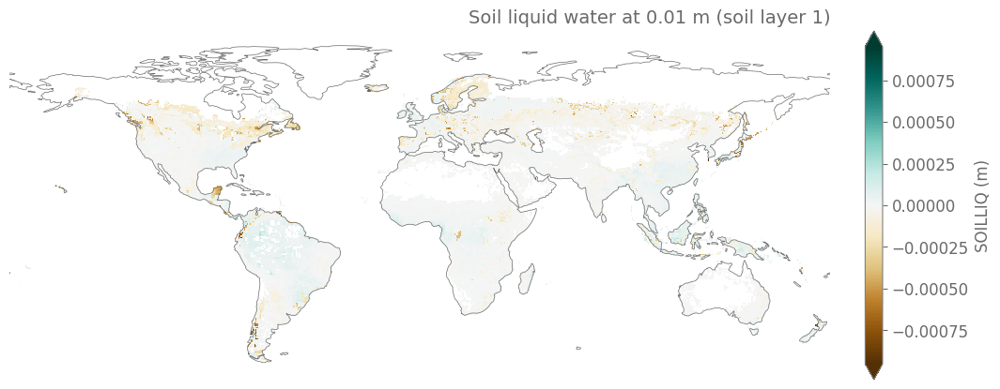

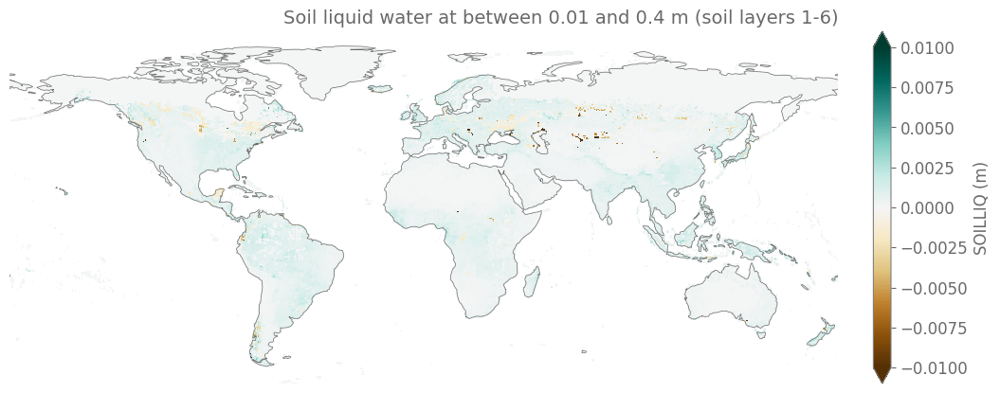

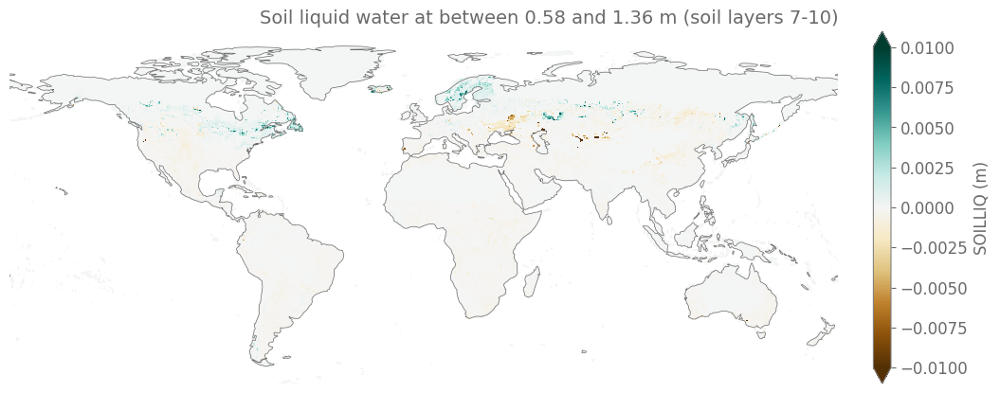

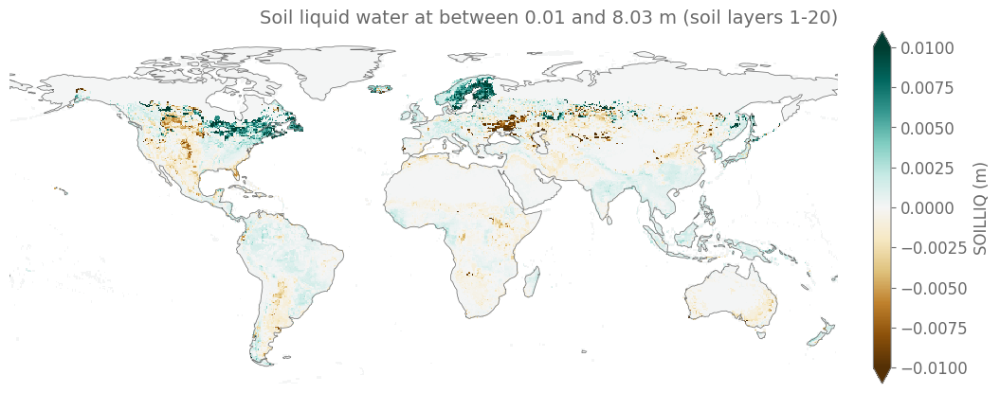

In [14]:
## volumetric soil moisture, aggregating over different layers
levsoi_selections = [ (0,5), (6,9), (0,19)]
region_ids_sel = [3,19,23]
# surface layer
da_delta_mean = da_delta.isel(levsoi=0).mean('time')

plt.figure(figsize=(12,5))
proj=ccrs.PlateCarree()
ax = plt.subplot(111, projection=proj)

# limiting values for plotting are given    
da_delta_mean.plot(ax=ax, cmap='BrBG', extend='both',  cbar_kwargs={'label': da_delta.name+' (m)', 'fraction': 0.02, 'pad': 0.04}, add_labels=False)

ax.set_title('Soil liquid water at '+str(da_delta.levsoi[0].values)+' m (soil layer 1)', loc='right')
ax.coastlines(color='dimgray', linewidth=0.5)
# exclude Antactica from plot
ax.set_extent((-180,180,-63,90), crs=proj);  
ax.axis('off')

vlims = [-1e-2,1e-2]

for levsoi_sel in levsoi_selections: 

    da_delta_mean = da_delta.isel(levsoi=range(levsoi_sel[0],levsoi_sel[1])).mean('time').sum('levsoi')

    plt.figure(figsize=(12,5))
    proj=ccrs.PlateCarree()
    ax = plt.subplot(111, projection=proj)

    # limiting values for plotting are given    
    da_delta_mean.where(landmask).plot(ax=ax, cmap='BrBG', vmin=vlims[0], vmax=vlims[1],  extend='both',  cbar_kwargs={'label': da_delta.name+' (m)', 'fraction': 0.02, 'pad': 0.04}, add_labels=False)

    ax.set_title('Soil liquid water at between '+str(da_delta.levsoi[levsoi_sel[0]].values)+' and '+str(da_delta.levsoi[levsoi_sel[1]].values)+' m (soil layers '+str(levsoi_sel[0]+1)+'-'+str(levsoi_sel[1]+1)+')', loc='right')
    ax.coastlines(color='dimgray', linewidth=0.5)
    # exclude Antactica from plot
    ax.set_extent((-180,180,-63,90), crs=proj);  
    ax.axis('off')

    
text_kws = dict(bbox=dict(color="none"),path_effects=[pe.withStroke(linewidth=2, foreground="w")], color="dimgray",fontsize=8)
regionmask.defined_regions.ar6.land[region_ids_sel].plot(ax=ax, projection=ccrs.PlateCarree(),text_kws=text_kws, add_ocean=False, label="abbrev");


In [38]:
## volumetric soil moisture, aggregating over different layers
levsoi_selections = [ (0,5), (6,9), (0,19)]
region_ids_sel = [3,19,23]
# surface layer
da_delta_mean = da_delta.isel(levsoi=0).mean('time')

plt.figure(figsize=(12,5))
proj=ccrs.PlateCarree()
ax = plt.subplot(111, projection=proj)

# limiting values for plotting are given    
da_delta_mean.plot(ax=ax, cmap='BrBG', extend='both',  cbar_kwargs={'label': da_delta.name+' (m)', 'fraction': 0.02, 'pad': 0.04}, add_labels=False)

ax.set_title('Soil liquid water at '+str(da_delta.levsoi[0].values)+' m (soil layer 1)', loc='right')
ax.coastlines(color='dimgray', linewidth=0.5)
# exclude Antactica from plot
ax.set_extent((-180,180,-63,90), crs=proj);  
ax.axis('off')

vlims = [-1e-3,1e-3]

for levsoi_sel in levsoi_selections: 

    da_delta_mean = da_delta.isel(levsoi=range(levsoi_sel[0],levsoi_sel[1])).mean('time').sum('levsoi')

    plt.figure(figsize=(12,5))
    proj=ccrs.PlateCarree()
    ax = plt.subplot(111, projection=proj)

    # limiting values for plotting are given    
    da_delta_mean.where(landmask).plot(ax=ax, cmap='BrBG', vmin=vlims[0], vmax=vlims[1],  extend='both',  cbar_kwargs={'label': da_delta.name+' (m)', 'fraction': 0.02, 'pad': 0.04}, add_labels=False)

    ax.set_title('Soil liquid water at between '+str(da_delta.levsoi[levsoi_sel[0]].values)+' and '+str(da_delta.levsoi[levsoi_sel[1]].values)+' m (soil layers '+str(levsoi_sel[0]+1)+'-'+str(levsoi_sel[1]+1)+')', loc='right')
    ax.coastlines(color='dimgray', linewidth=0.5)
    # exclude Antactica from plot
    ax.set_extent((-180,180,-63,90), crs=proj);  
    ax.axis('off')

    
text_kws = dict(bbox=dict(color="none"),path_effects=[pe.withStroke(linewidth=2, foreground="w")], color="dimgray",fontsize=8)
regionmask.defined_regions.ar6.land[region_ids_sel].plot(ax=ax, projection=ccrs.PlateCarree(),text_kws=text_kws, add_ocean=False, label="abbrev");


ValueError: Dimensions {'levsoi'} do not exist. Expected one or more of ('time', 'ivt_str', 'lat', 'lon')

In [14]:
variables_toplot = ["TOTSOILLIQ", "QINFL" , "QOVER", "QDRAI",'EFLX_LH_TOT', "QVEGE", "QVEGT","QSOIL"]

In [23]:

# calculate and plot difference map of variable
def calc_plot_delta_da(da_delta, da_ctl, variable,d_vlims): 

    if variable in d_vlims.keys(): 
        if 'levsoi' in da_delta.dims: 
            da_delta = da_delta.weighted(da_delta['levsoi']).mean(dim='levsoi')
        elif 'levgrnd' in da_delta.dims: 

            da_delta = da_delta.weighted(da_delta['levgrnd']).mean(dim='levgrnd')

        da_delta.attrs = da_ctl.attrs


        plot_delta_map(da_delta, plot_regions=False, vlims=d_vlims[variable], calcsum=False, cmap='BrBG')
        
    else: 
        print(variable +' not in limits')
              

#### converted

In [24]:
# difference 

d_vlims = {"QDRAI"        : [-5e-3,5e-3], 
           "QINFL"         : [-5e-3,5e-3],
           "QOVER"         : [-5e-3,5e-3],
           "TOTSOILLIQ"    : [-5e-3,5e-3],
           "EFLX_LH_TOT"   : [-5e-3,5e-3],
           "QVEGT"         : [-5e-3,5e-3], 
           "QVEGE"         : [-5e-3,5e-3], 
           "QSOIL"         : [-5e-3,5e-3],
           "SOILWATER_10CM": [-4,4]}

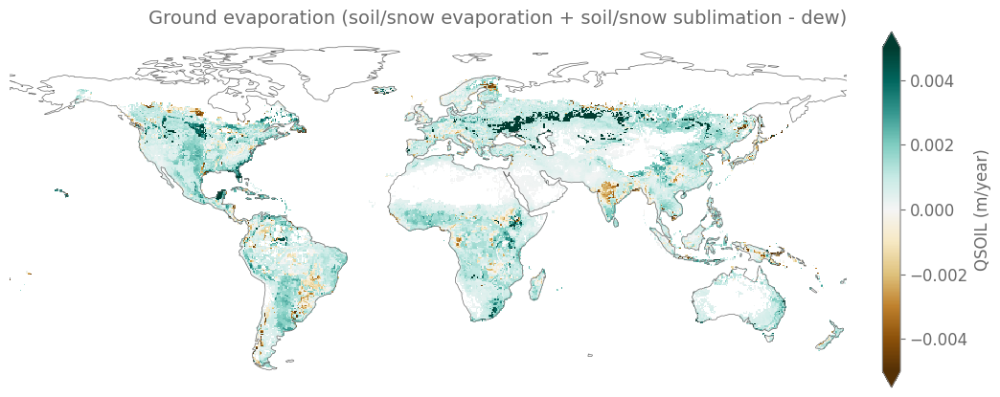

In [25]:
variables_toplot = ["QSOIL"]
pft_int = pft_list_crops[0]

for i, variable in enumerate(variables_toplot): 
   
    da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)

    da_pft_scen = load_da_gridded_pft(variable, pft_int, case_scen).rename(variable)
    
    da_pft_ctl_conv = conv_hydrol_var(da_pft_ctl.to_dataset(), [variable])[variable]
    da_pft_ctl_conv.attrs['long_name'] = da_pft_ctl.long_name

    da_pft_scen_conv = conv_hydrol_var(da_pft_scen.to_dataset(),[variable])[variable]
    da_pft_scen_conv.attrs['long_name'] = da_pft_scen.long_name

    
    da_delta = da_pft_scen_conv - da_pft_ctl_conv
    calc_plot_delta_da(da_delta, da_pft_ctl_conv, variable, d_vlims)
    
    

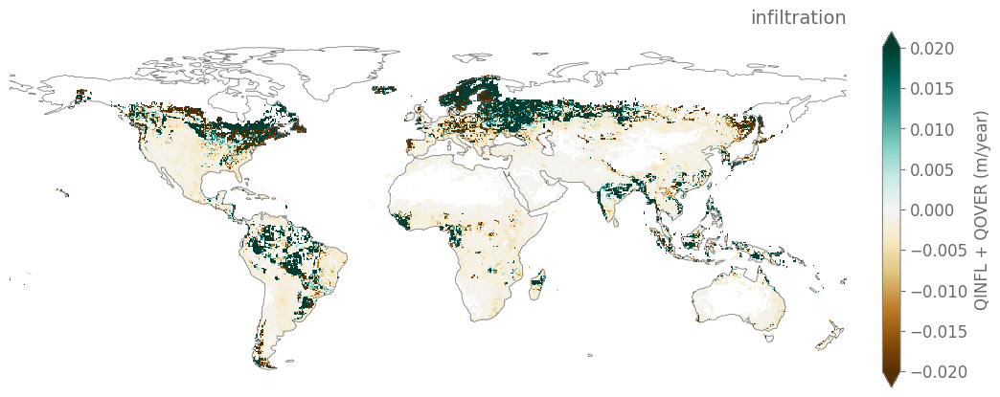

In [26]:
d_vlims = {"QDRAI"        : [-10e-2,10e-2], 
           "QINFL"         : [-10e-3,10e-3]}
d_vlims = {"QDRAI"        : [-10e-2,10e-2], 
           "QINFL"         : [-5e-3,5e-3]}


d_vlims = {"QDRAI"        : [-2e-2,2e-2], 
           "QINFL"         : [-2e-2,2e-2], 
           "QOVER"         : [-2e-2,2e-2], 
           "TOTSOILLIQ"    : [-2e-2,2e-2], 
           "EFLX_LH_TOT"   : [-2e-2,2e-2], 
           "QVEGT"         : [-2e-2,2e-2], 
           "QVEGE"         : [-2e-2,2e-2], 
           "QSOIL"         : [-2e-2,2e-2], 
           "SOILWATER_10CM": [-4,4]}

pft_int = pft_list_crops[0]

variable =   "QINFL" 
da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)
da_pft_scen = load_da_gridded_pft(variable, pft_int, case_scen).rename(variable)
    
da_pft_ctl_conv = conv_hydrol_var(da_pft_ctl.to_dataset(), [variable])[variable]
da_pft_ctl_conv.attrs['long_name'] = da_pft_ctl.long_name

da_pft_scen_conv = conv_hydrol_var(da_pft_scen.to_dataset(),[variable])[variable]
da_pft_scen_conv.attrs['long_name'] = da_pft_scen.long_name

variable1 =   "QOVER" 
da_pft_ctl1 = load_da_gridded_pft(variable1, pft_int, case_ctl).rename(variable)
da_pft_scen1 = load_da_gridded_pft(variable1, pft_int, case_scen).rename(variable)
    
da_pft_ctl_conv1 = conv_hydrol_var(da_pft_ctl1.to_dataset(), [variable])[variable]
da_pft_ctl_conv1.attrs['long_name'] = da_pft_ctl1.long_name

da_pft_scen_conv1 = conv_hydrol_var(da_pft_scen1.to_dataset(),[variable])[variable]
da_pft_scen_conv1.attrs['long_name'] = da_pft_scen1.long_name


da_delta = (da_pft_scen_conv +da_pft_scen_conv1) - (da_pft_ctl_conv+da_pft_ctl_conv1)
da_delta.name = variable + " + "+variable1
da_delta.attrs['long_name'] = variable + " + "+variable1

calc_plot_delta_da(da_delta, da_pft_ctl_conv, variable, d_vlims)
    
    

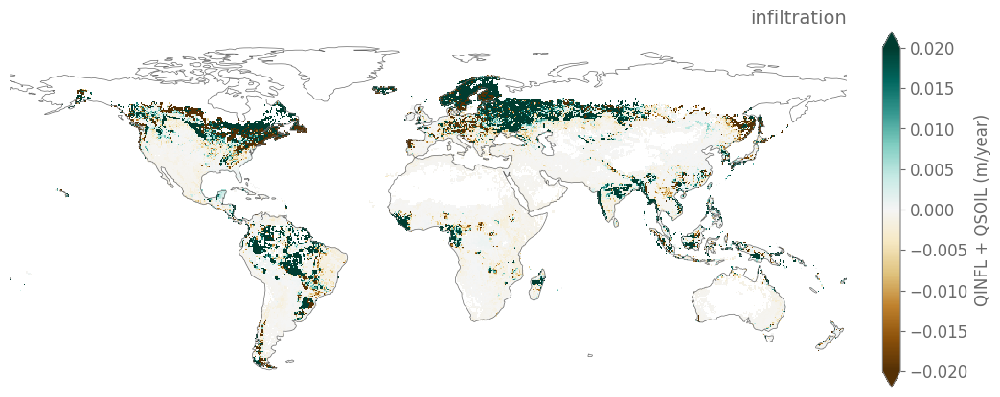

In [27]:
d_vlims = {"QDRAI"        : [-10e-2,10e-2], 
           "QINFL"         : [-5e-3,5e-3],}


d_vlims = {"QDRAI"        : [-2e-2,2e-2], 
           "QINFL"         : [-2e-2,2e-2], 
           "QOVER"         : [-2e-2,2e-2], 
           "TOTSOILLIQ"    : [-2e-2,2e-2], 
           "EFLX_LH_TOT"   : [-2e-2,2e-2], 
           "QVEGT"         : [-2e-2,2e-2], 
           "QVEGE"         : [-2e-2,2e-2], 
           "QSOIL"         : [-2e-2,2e-2], 
           "SOILWATER_10CM": [-4,4]}


pft_int = pft_list_crops[0]

variable =   "QINFL" 
da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)
da_pft_scen = load_da_gridded_pft(variable, pft_int, case_scen).rename(variable)
    
da_pft_ctl_conv = conv_hydrol_var(da_pft_ctl.to_dataset(), [variable])[variable]
da_pft_ctl_conv.attrs['long_name'] = da_pft_ctl.long_name

da_pft_scen_conv = conv_hydrol_var(da_pft_scen.to_dataset(),[variable])[variable]
da_pft_scen_conv.attrs['long_name'] = da_pft_scen.long_name

variable1 =   "QSOIL" 
da_pft_ctl1 = load_da_gridded_pft(variable1, pft_int, case_ctl).rename(variable)
da_pft_scen1 = load_da_gridded_pft(variable1, pft_int, case_scen).rename(variable)
    
da_pft_ctl_conv1 = conv_hydrol_var(da_pft_ctl1.to_dataset(), [variable])[variable]
da_pft_ctl_conv1.attrs['long_name'] = da_pft_ctl1.long_name

da_pft_scen_conv1 = conv_hydrol_var(da_pft_scen1.to_dataset(),[variable])[variable]
da_pft_scen_conv1.attrs['long_name'] = da_pft_scen1.long_name


da_delta = (da_pft_scen_conv +da_pft_scen_conv1) - (da_pft_ctl_conv+da_pft_ctl_conv1)
da_delta.name = variable + " + "+variable1
da_delta.attrs['long_name'] = variable + " + "+variable1

calc_plot_delta_da(da_delta, da_pft_ctl_conv, variable, d_vlims)
    
    

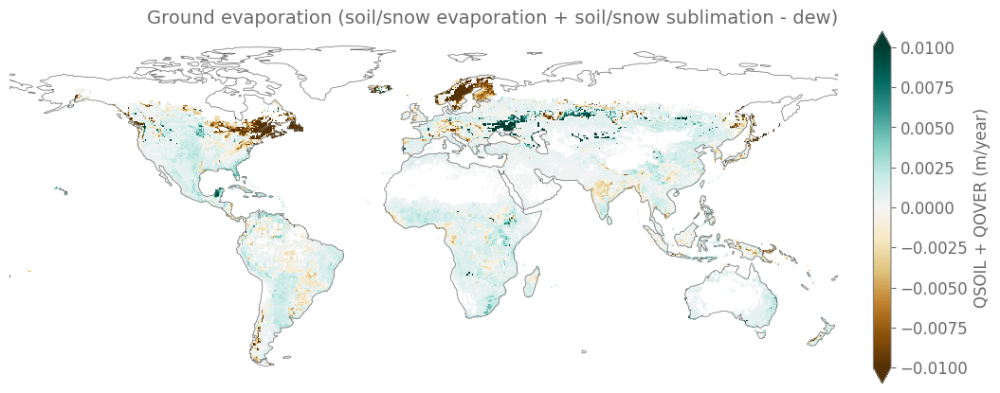

In [28]:

d_vlims = {"QDRAI"        : [-2e-2,2e-2], 
           "QINFL"         : [-2e-2,2e-2], 
           "QOVER"         : [-2e-2,2e-2], 
           "TOTSOILLIQ"    : [-2e-2,2e-2], 
           "EFLX_LH_TOT"   : [-2e-2,2e-2], 
           "QVEGT"         : [-2e-2,2e-2], 
           "QVEGE"         : [-2e-2,2e-2], 
           "QSOIL"         : [-2e-2,2e-2], 
           "SOILWATER_10CM": [-4,4]}


pft_int = pft_list_crops[0]

variable =   "QSOIL" 
da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)
da_pft_scen = load_da_gridded_pft(variable, pft_int, case_scen).rename(variable)
    
da_pft_ctl_conv = conv_hydrol_var(da_pft_ctl.to_dataset(), [variable])[variable]
da_pft_ctl_conv.attrs['long_name'] = da_pft_ctl.long_name

da_pft_scen_conv = conv_hydrol_var(da_pft_scen.to_dataset(),[variable])[variable]
da_pft_scen_conv.attrs['long_name'] = da_pft_scen.long_name

variable1 =   "QOVER" 
da_pft_ctl1 = load_da_gridded_pft(variable1, pft_int, case_ctl).rename(variable)
da_pft_scen1 = load_da_gridded_pft(variable1, pft_int, case_scen).rename(variable)
    
da_pft_ctl_conv1 = conv_hydrol_var(da_pft_ctl1.to_dataset(), [variable])[variable]
da_pft_ctl_conv1.attrs['long_name'] = da_pft_ctl1.long_name

da_pft_scen_conv1 = conv_hydrol_var(da_pft_scen1.to_dataset(),[variable])[variable]
da_pft_scen_conv1.attrs['long_name'] = da_pft_scen1.long_name


da_delta = (da_pft_scen_conv +da_pft_scen_conv1) - (da_pft_ctl_conv+da_pft_ctl_conv1)
da_delta.name = variable + " + "+variable1
da_delta.attrs['long_name'] = variable + " + "+variable1
d_vlims = {"QSOIL"        : [-1e-2,1e-2], 
           "QINFL"         : [-10e-3,10e-3]}
calc_plot_delta_da(da_delta, da_pft_ctl_conv, variable, d_vlims)
    
    

In [17]:
# difference 
d_vlims = {"QDRAI"         : [-2e-2,2e-2], 
           "QINFL"         : [-2e-2,2e-2],
           "QOVER"         :  [-2e-2,2e-2],
           "TOTSOILLIQ"    :  [-2e-2,2e-2],
           "EFLX_LH_TOT"   :  [-2e-2,2e-2],
           "QVEGT"         :  [-2e-2,2e-2], 
           "QVEGE"         :  [-2e-2,2e-2], 
           "QSOIL"         :  [-2e-2,2e-2],
           "SOILWATER_10CM": [-4,4]}



d_vlims = {"QDRAI"         : [-0.5e-2,0.5e-2], 
           "QINFL"         : [-0.5e-2,0.5e-2],
           "QOVER"         : [-0.5e-2,0.5e-2],
           "TOTSOILLIQ"    : [-0.5e-2,0.5e-2],
           "EFLX_LH_TOT"   : [-0.5e-2,0.5e-2],
           "QVEGT"         : [-0.5e-2,0.5e-2], 
           "QVEGE"         : [-0.5e-2,0.5e-2],
           "QSOIL"         : [-0.5e-2,0.5e-2],
            "TOTSOILLIQ"         : [-0.5e-2,0.5e-2], }




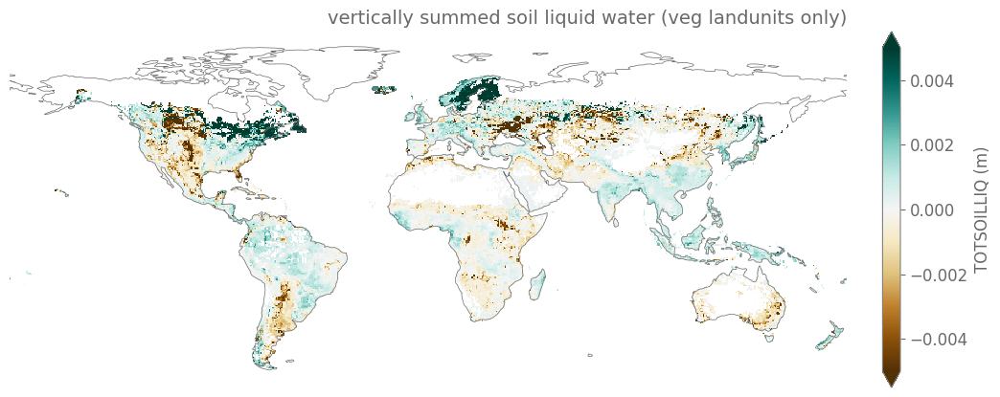

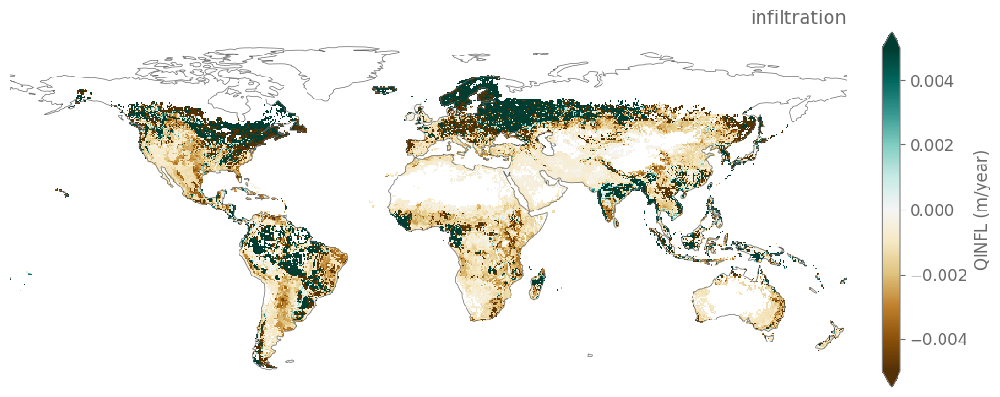

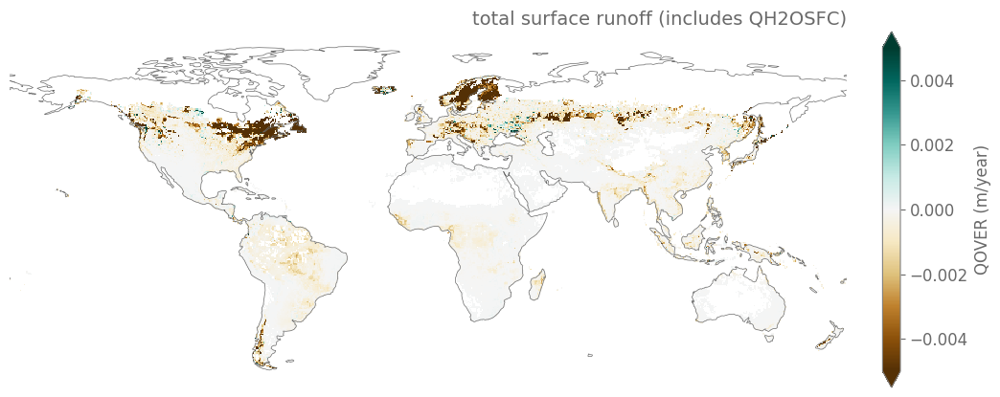

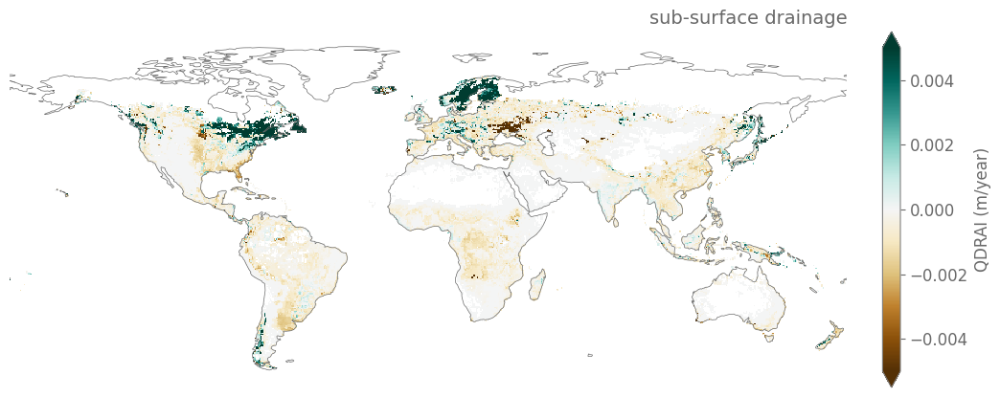

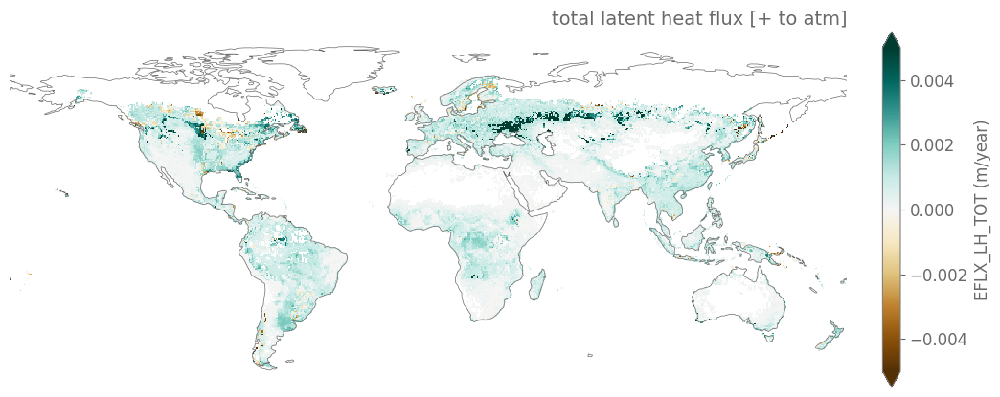

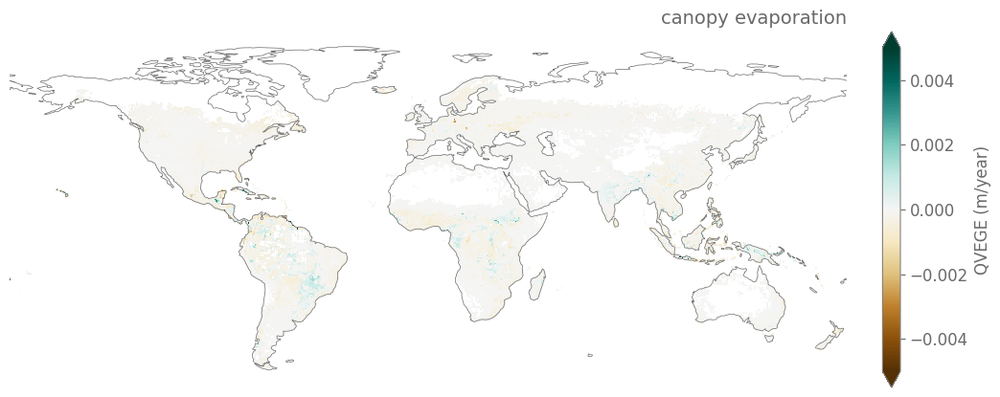

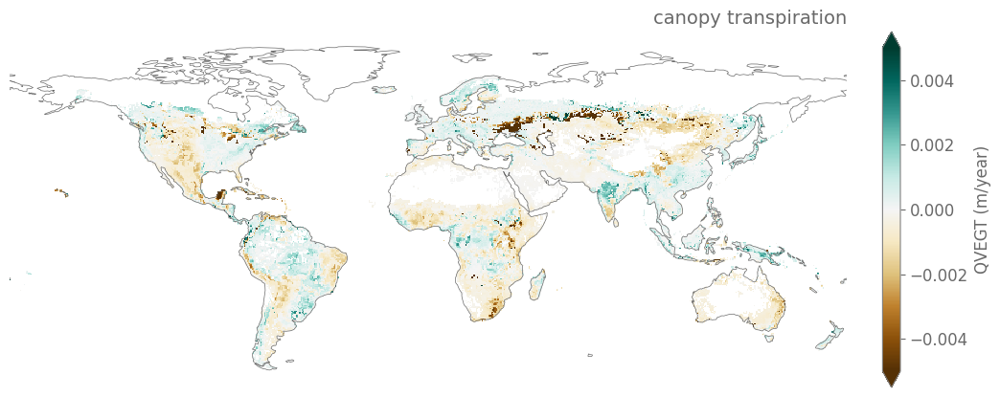

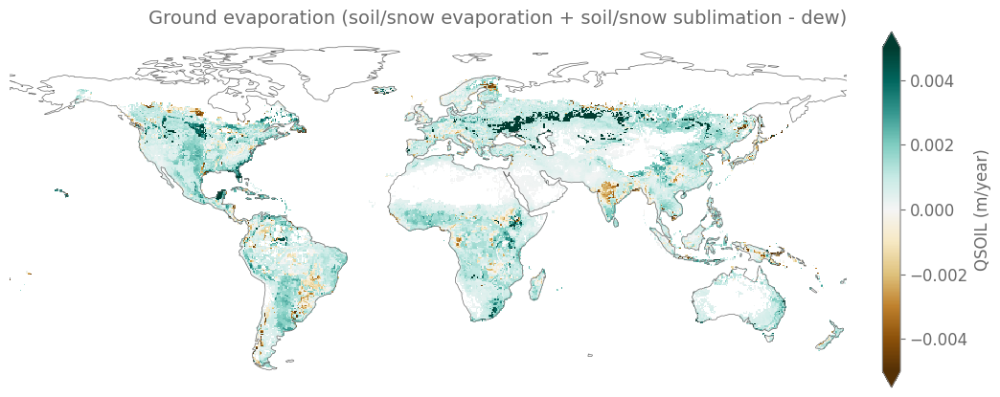

In [18]:
# define scenario
variables_toplot = ["TOTSOILLIQ", "QINFL" , "QOVER", "QDRAI",'EFLX_LH_TOT', "QVEGE", "QVEGT","QSOIL"]

pft_int = pft_list_crops[0]

for i, variable in enumerate(variables_toplot): 
   
    da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)

    da_pft_scen = load_da_gridded_pft(variable, pft_int, case_scen).rename(variable)
    
    da_pft_ctl_conv = conv_hydrol_var(da_pft_ctl.to_dataset(), [variable])[variable]
    da_pft_ctl_conv.attrs['long_name'] = da_pft_ctl.long_name

    da_pft_scen_conv = conv_hydrol_var(da_pft_scen.to_dataset(),[variable])[variable]
    da_pft_scen_conv.attrs['long_name'] = da_pft_scen.long_name

    
    da_delta = (da_pft_scen_conv - da_pft_ctl_conv)

    calc_plot_delta_da(da_delta, da_pft_ctl_conv, variable, d_vlims)
    
    

QVEGE not in limits
QVEGT not in limits
QSOIL not in limits


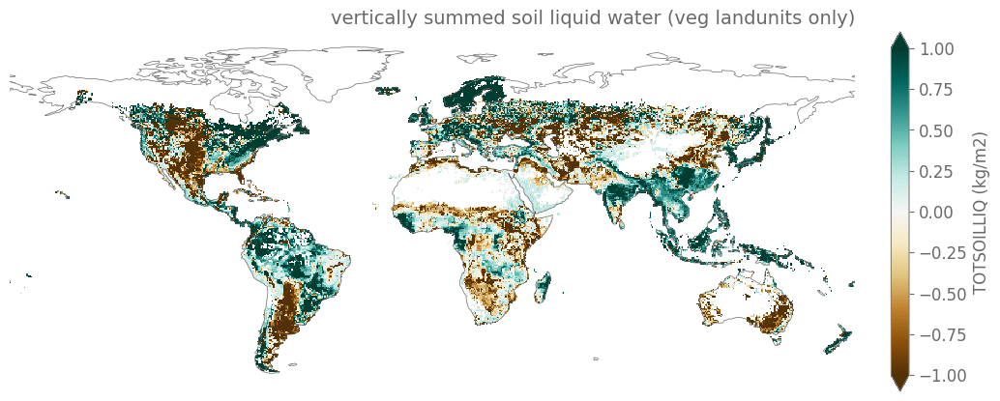

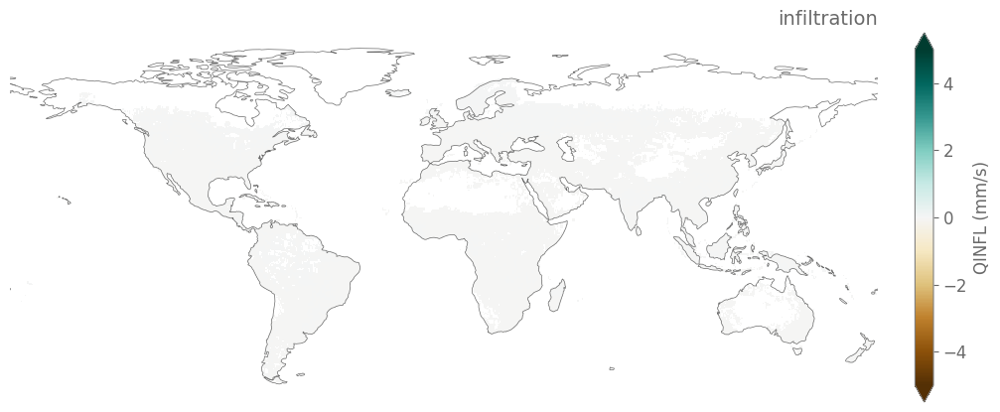

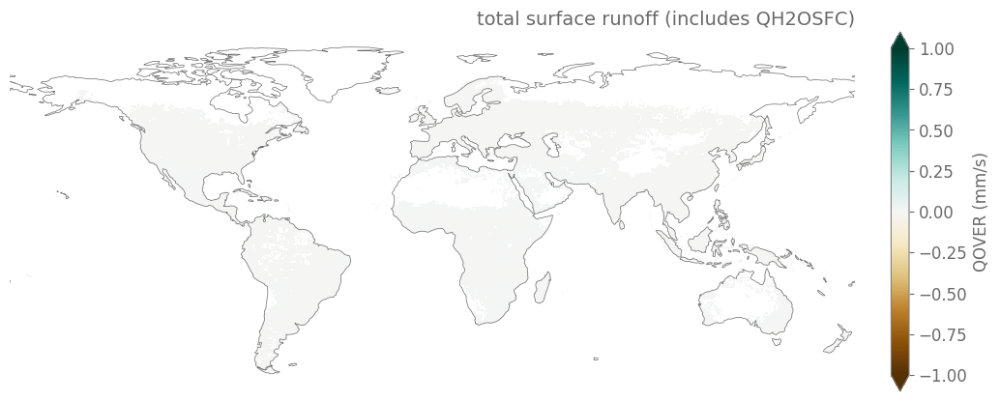

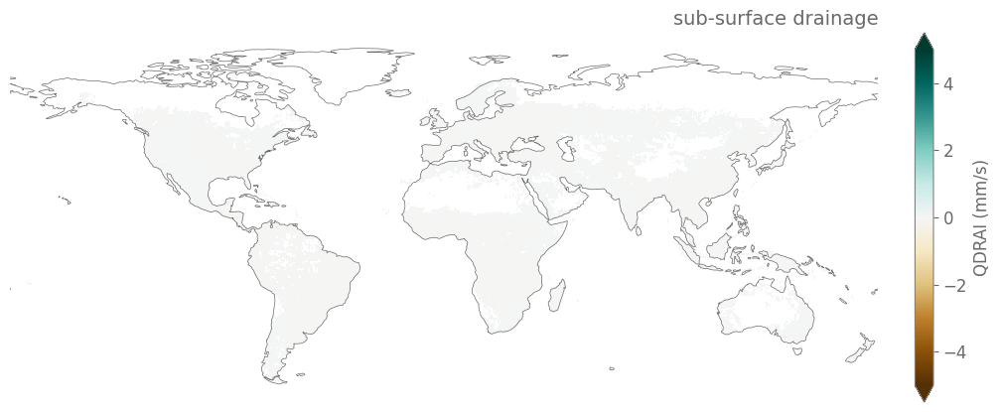

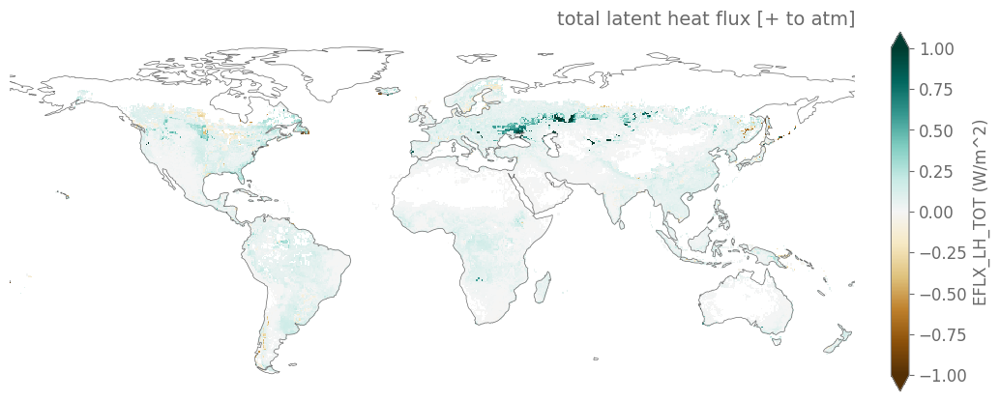

In [40]:

pft_int = pft_list_crops[0]

for i, variable in enumerate(variables_toplot): 
   
    da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)

    da_pft_scen = load_da_gridded_pft(variable, pft_int, case_scen).rename(variable)

    da_delta = da_pft_scen - da_pft_ctl
    calc_plot_delta_da(da_delta, da_pft_ctl, variable, d_vlims)

In [42]:
d_vlims = { "QDRAI"         : False, 
           "QINFL"         : False,
           "QVEGE"         : False, 
           "QVEGT" : False, 
           "QSOIL": False, 
           "QOVER"         : False,
           "TOTSOILLIQ"    : False,
           "TOTSOILICE"    :  [-20,20], 
           "SOILWATER_10CM": [-4,4],
           "TWS"           : [-8,8],
           "ZWT"           : [-0.005,0.005], 
           "QINFL"         : False,
           "EFLX_LH_TOT"         : False,}


In [44]:
d_vlims = { "QDRAI"         : [-1e-7,1e-7], 
           "QINFL"         : [-1e-5,1e-5],
           "QOVER"         : [-1e-7,1e-7],
           "TOTSOILLIQ"    : [-20,20],
           "TOTSOILICE"    :  [-20,20], 
           "SOILWATER_10CM": [-4,4],
           "TWS"           : [-8,8],
           "ZWT"           : [-0.005,0.005], 
           "QINFL"         : [-1e-5,1e-5],
           "EFLX_LH_TOT"         : [-0.5,0.5],}


QVEGE not in limits
QVEGT not in limits
QSOIL not in limits


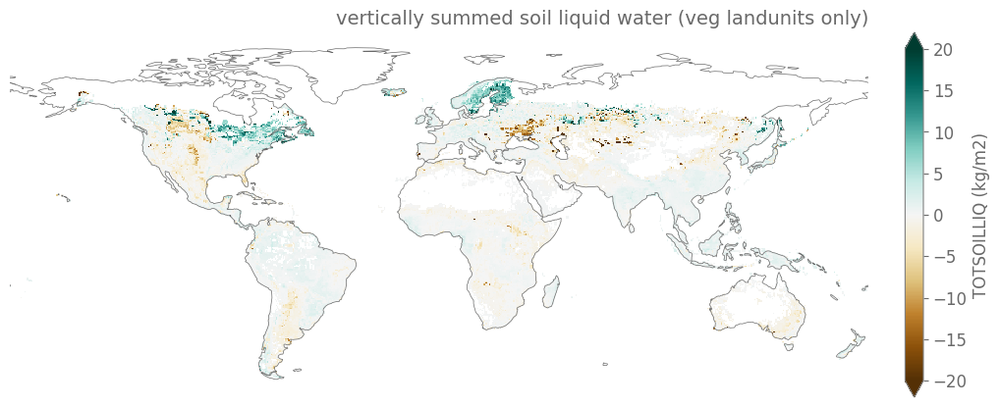

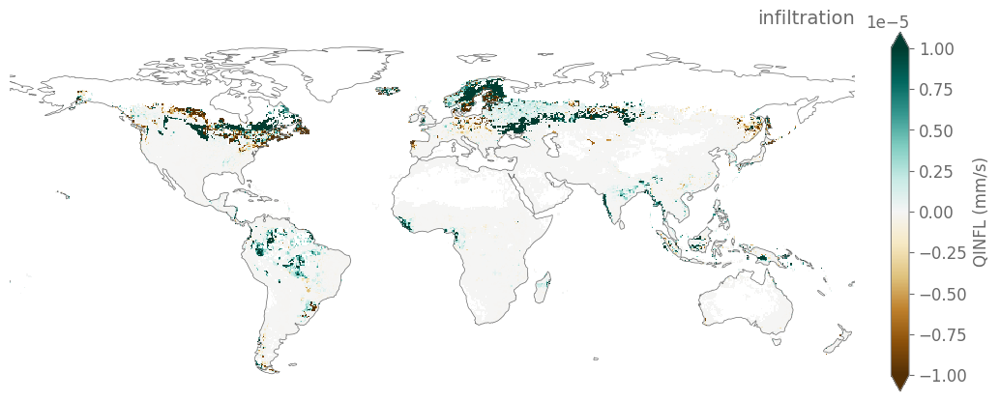

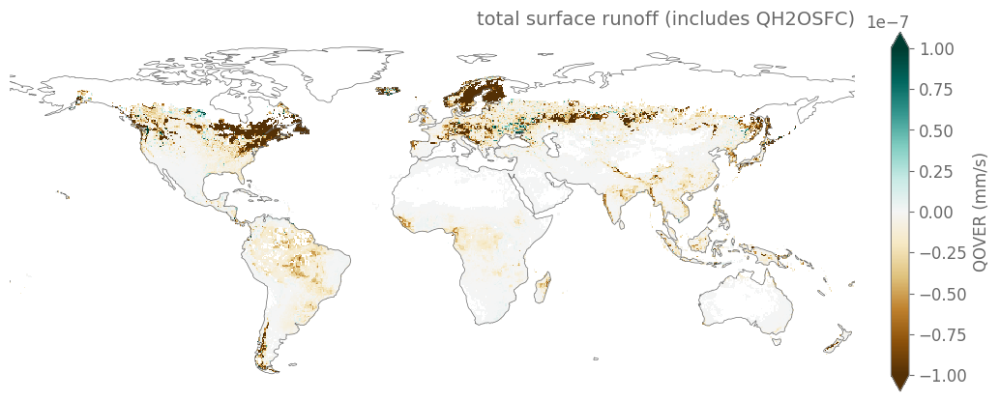

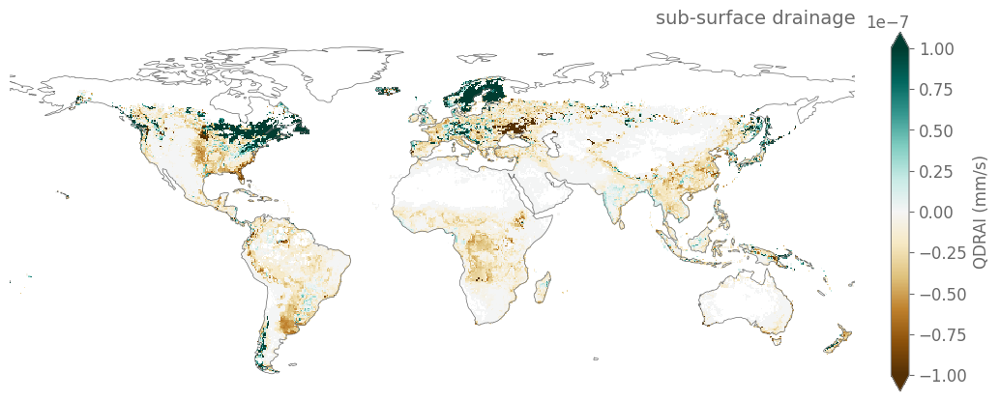

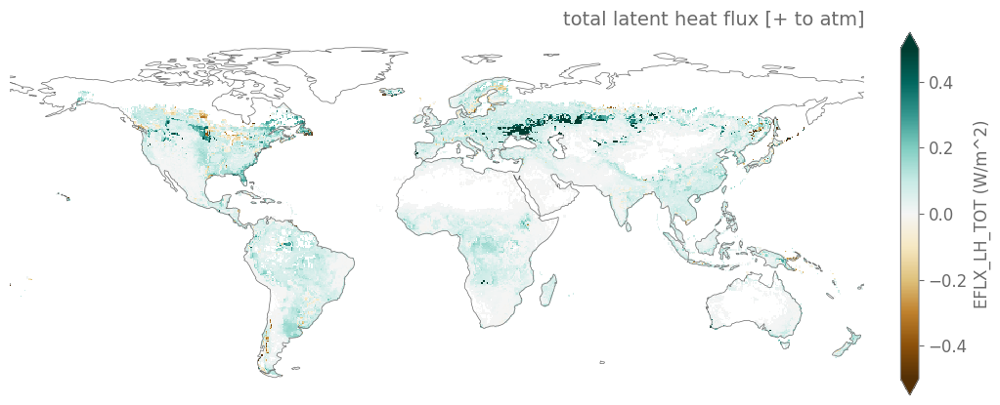

In [45]:
variables_wb_toplot = ['QDRAI', 'QINFL', 'QOVER', 'SOILLIQ', 'ET',  "QVEGE", "QVEGT","QSOIL", 'QIRRIG_FROM_SURFACE']

pft_int = pft_list_crops[0]

for i, variable in enumerate(variables_toplot): 
   
    da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)

    da_pft_scen = load_da_gridded_pft(variable, pft_int, case_scen).rename(variable)

    da_delta = da_pft_scen - da_pft_ctl
    calc_plot_delta_da(da_delta, da_pft_ctl, variable, d_vlims)

In [34]:
d_vlims = {"QDRAI"         : [-5,5], 
           "QINFL"         :  [-5,5], 
           "QOVER"         :  [-1,1], 
           "QRUNOFF"         : [-1e-7,1e-7],
           "TOTSOILLIQ"    :  [-1,1], 
           "TOTSOILICE"    :  [-10,10], 
           "SOILWATER_10CM":  [-5,5], 
           "TWS"           :  [-1,1], 
           "ZWT"           :  [-1,1], 
           "FH2OSFC"      :  [-5,5], 
           "EFLX_LH_TOT"         : [-1,1],
            "H2OSOI"         : [-0.1,0.1],
            "SOILLIQ"         : [-1,1],
            "SOILICE"         : [-20,20],
           "watfc"         : [-0.01,0.01], 
           "watsat"        : [-0.01,0.01],       
           'SOILPSI'       : [-1,1],
           'SMP'           : [-2,2],
          "QHR" : [-50,50]}


In [35]:

pft_int = pft_list_crops[0]

for i, variable in enumerate(variables_toplot): 
    print(variable)
   
    da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)

    da_pft_scen = load_da_gridded_pft(variable, pft_int, case_scen).rename(variable)

    da_delta = da_pft_scen - da_pft_ctl
    
    da_delta.attrs['units'] = 'mm/s'
    da_delta.attrs['long_name'] = da_delta.name
    da_pft_ctl.attrs['units'] = 'mm/s'
    da_pft_ctl.attrs['long_name'] = da_pft_ctl.name    
    
    calc_plot_delta_rel_da(da_delta, da_pft_ctl, variable, d_vlims)
    


QSOIL
QSOIL not in limits


## Look at WB variables for cropland

In [36]:
%%time 

flag_calc_wb = True
pft_list = pft_list_crops

if flag_calc_wb:


    variables_wb = ['QDRAI', 'QINFL', 'QOVER', 'TOTSOILLIQ', 'EFLX_LH_TOT',   "QVEGE", "QVEGT","QSOIL", 'QIRRIG_FROM_SURFACE']
    variables_wb_toplot = ['QDRAI', 'QINFL', 'QOVER', 'SOILLIQ', 'ET',  "QVEGE", "QVEGT","QSOIL", 'QIRRIG_FROM_SURFACE']

    d_wb_vars = {}


    for pft_int in pft_list: 
        for i,region in enumerate(region_ids):
            print(region)

            region_name = regionmask.defined_regions.ar6.land[region].name
            region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

            d_var_list = {}

            for variable,variable_toplot in zip(variables_wb,variables_wb_toplot): 
                print(variable)


                da_delta, da_delta_rel = calc_delta_and_rel_pft(case_ctl, case_scen, variable, pft_list)
                list_da_pft = [] 

                for pft_int in pft_list: 

                    list_da_pft.append(load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable))

                da_ctl = xr.concat(list_da_pft, dim='ivt_str').rename({'ivt_str':'pft'})
                da_ctl['pft'] = pft_list

                mask = regionmask.defined_regions.ar6.land.mask(da_delta)

                da_delta_timmean = (da_delta).mean('time') 
                da_ctl_timmean = da_ctl.mean('time')

                da_ctl_seasmean_region = (da_delta_timmean.sel(pft=pft_int).where(mask==region).mean(dim=('lat','lon')) / da_ctl_timmean.sel(pft=pft_int).where(mask==region).mean(dim=('lat','lon'))).values*100

                d_var_list[variable_toplot]= da_ctl_seasmean_region

            d_wb_vars[str(region)] = pd.Series(d_var_list).to_frame(name=str(region))

            df_wbterms = pd.concat([v for k,v in d_wb_vars.items()],axis=1)
            df_wbterms.to_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'_'+str(pft_int)+'.nc')

else: 
    d_wbterms = {}
    for pft_int in pft_list: 
        d_wbterms[pft_int] = pd.read_csv(procdir+'postprocessing/wbterm_delta_per_region_'+scenario+'_'+str(pft_int)+'.nc', index_col=0)
    

3
QDRAI


FileNotFoundError: [Errno 2] No such file or directory: '/scratch/snx3000/ivanderk/processing_4p1000/postprocessing/pft_gridding/QDRAI_16.IHistClm51Sp.hcru_hcru_mt13.pftsoilcol.CTL.spunup2.nophs.nc'

NameError: name 'df_wbterms' is not defined

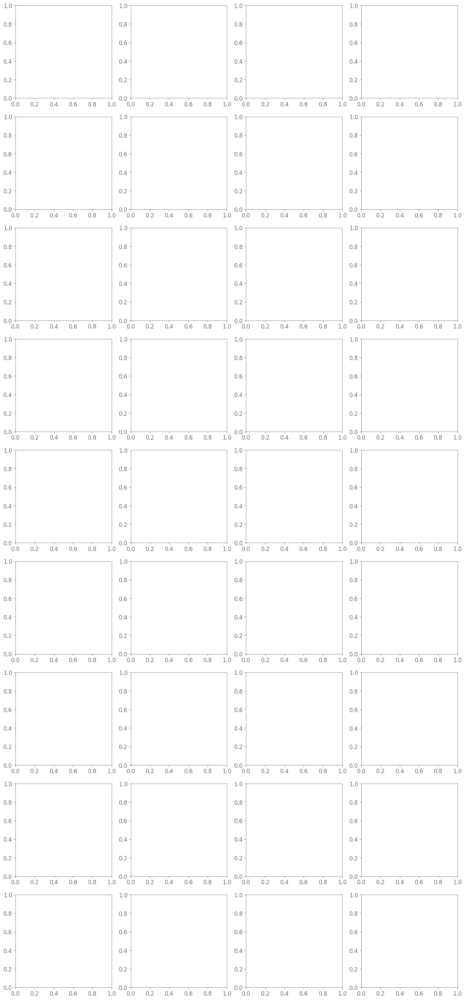

In [37]:
pft_int = pft_list_crops[0]
variables_wb_toplot = ['SOILLIQ','QDRAI', 'QOVER',  'ET', 'QVEGE', 'QVEGT', 'QSOIL']

fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

variables_wb = list(df_wbterms.index)
x = np.arange(1,len(variables_wb)+1,1)

for i,region in enumerate(region_ids):
    
    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    ax = axes[i]

    df_wbterms.loc[variables_wb_toplot, str(region)].plot.bar(ax=ax, legend=False)
    ax.set_title(region_name,loc='right')
    ax.axhline(y=0, color='dimgray', linewidth=0.5)
    ax.axvline(x=0.5, color='dimgray', linewidth=1, linestyle = 'dotted')
    ax.axvline(x=3.5, color='dimgray', linewidth=1, linestyle = 'dotted')

    ax.set_ylabel('% change')

    ax.set_xticks(range(0,len(variables_wb_toplot)),list(variables_wb_toplot), rotation=45, ha='right')

fig.tight_layout()

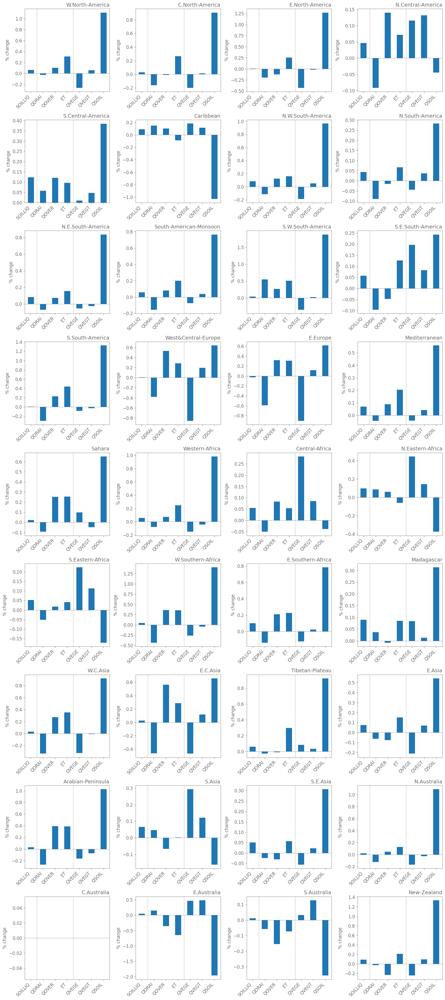

In [27]:
pft_int = pft_list_crops[1]
variables_wb_toplot = ['SOILLIQ','QDRAI', 'QOVER',  'ET', 'QVEGE', 'QVEGT', 'QSOIL']

fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

variables_wb = list(df_wbterms.index)
x = np.arange(1,len(variables_wb)+1,1)

for i,region in enumerate(region_ids):
    
    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    ax = axes[i]

    df_wbterms.loc[variables_wb_toplot, str(region)].plot.bar(ax=ax, legend=False)
    ax.set_title(region_name,loc='right')
    ax.axhline(y=0, color='dimgray', linewidth=0.5)
    ax.axvline(x=0.5, color='dimgray', linewidth=1, linestyle = 'dotted')
    ax.axvline(x=3.5, color='dimgray', linewidth=1, linestyle = 'dotted')

    ax.set_ylabel('% change')

    ax.set_xticks(range(0,len(variables_wb_toplot)),list(variables_wb_toplot), rotation=45, ha='right')

fig.tight_layout()

## Look at saturation ratio for cropland

In [10]:
# saturation ratio
variable = 'H2OSOI'
pft_list = pft_list_crops

flag_calc_regionmeans = False

if flag_calc_regionmeans: 
    
    save_regionalmean_delta_and_delta_rel(variable, pft_list, case_ctl, case_scen, region_ids, mask_regions)



In [11]:
# saturation ratio
variable = 'satfrac'
pft_list = pft_list_crops

flag_calc_regionmeans = False

if flag_calc_regionmeans: 

    save_regionalmean_delta_and_delta_rel(variable, pft_list, case_ctl, case_scen, region_ids, mask_regions)


In [12]:
# saturation ratio
variable = 'watfc'
pft_list = pft_list_crops

flag_calc_regionmeans = False

if flag_calc_regionmeans: 

    save_regionalmean_delta_and_delta_rel(variable, pft_list, case_ctl, case_scen, region_ids, mask_regions)


In [13]:
# CONTROL case root water uptake

variable = 'QROOTSINK'

flag_calc_regionmeans = False

if flag_calc_regionmeans: 

    for pft_int in pft_list_crops: 
        print('processing pft: '+str(pft_int))

        # calculate delta and relative delta of saturation ratio. 
        da_pft_ctl = load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable)
        
        # calculate regional means. 
        ds_regions = calc_regionalmeans(da_pft_ctl, region_ids, mask_regions)

        ds_regions.to_netcdf(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.ctl.nc')
        
   

### Relative change

In [15]:
pft_int = pft_list_crops[0]

variable = 'QROOTSINK'
da_ctl_region_qroot = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.ctl.nc')[variable]
da_ctl_region_qroot_seasmean = da_ctl_region_qroot.groupby('time.month').mean().squeeze()

flag_plot_rootuptake = True


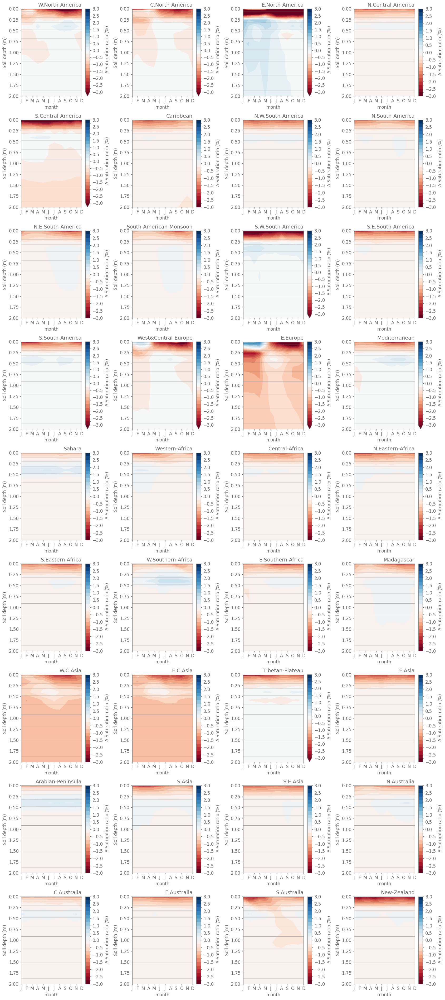

In [16]:
# prepare for plotting 
flag_plot_rootuptake = False

variable = 'satfrac'
# open regions dataset
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.delta_change_rel.nc')[variable]

da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()



fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    
    levels =np.arange(-3,3.25,0.25)
    ticks =np.arange(-3,3.5,0.5)
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' $\Delta$ Saturation ratio (%)', 'ticks':ticks}, levels= levels)

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

### Absolute change

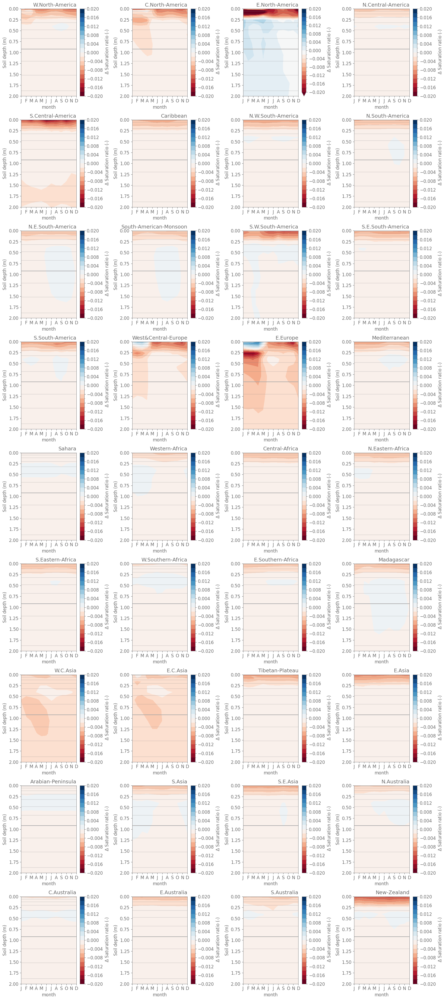

In [17]:
# prepare for plotting 
variable = 'satfrac'

# open regions dataset
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.delta_change.nc')[variable]

da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()



fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    
    levels =np.arange(-0.02,0.022,0.002)
    ticks =np.arange(-0.02,0.024,0.004)
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' $\Delta$ Saturation ratio (-)', 'ticks':ticks}, levels= levels)

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

## volumetric soil moisture

### relative change

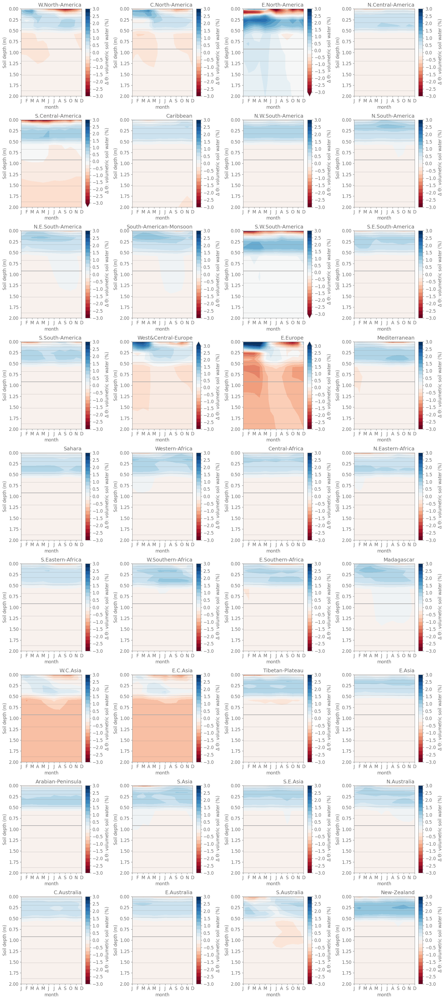

In [18]:
# prepare for plotting 
variable = 'H2OSOI'

# open regions dataset
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.delta_change_rel.nc')[variable]

da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()



fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    
    levels =np.arange(-3,3.25,0.25)
    ticks =np.arange(-3,3.5,0.5)
    
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' $\Delta$ $\Theta$: volumetric soil water (%)', 'ticks':ticks}, levels= levels)

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

### absolute change

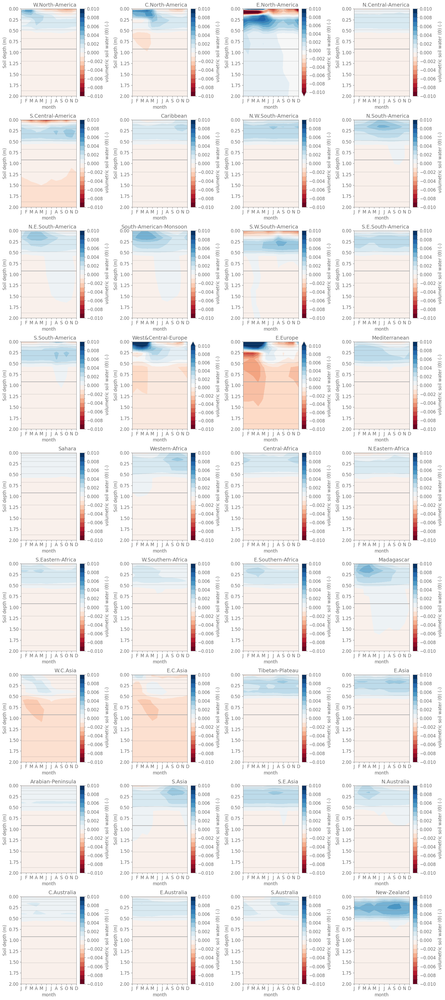

In [19]:
# prepare for plotting 
variable = 'H2OSOI'

# open regions dataset
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.delta_change.nc')[variable]

da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()



fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev
    
    levels =np.arange(-0.01,0.011,0.001)
    ticks =np.arange(-0.01,0.012,0.002)
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' volumetric soil water ($\Theta$) (-)', 'ticks':ticks}, levels= levels)
    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

## Look at sand

In [23]:
texture_mask = da_sand_mask
region_ids = regions_sand_clay

pft_int = pft_list_crops[0]

flag_plot_rootuptake = True

figsize = (17,20)

### saturated fraction

#### Relative change

PCT_SAND


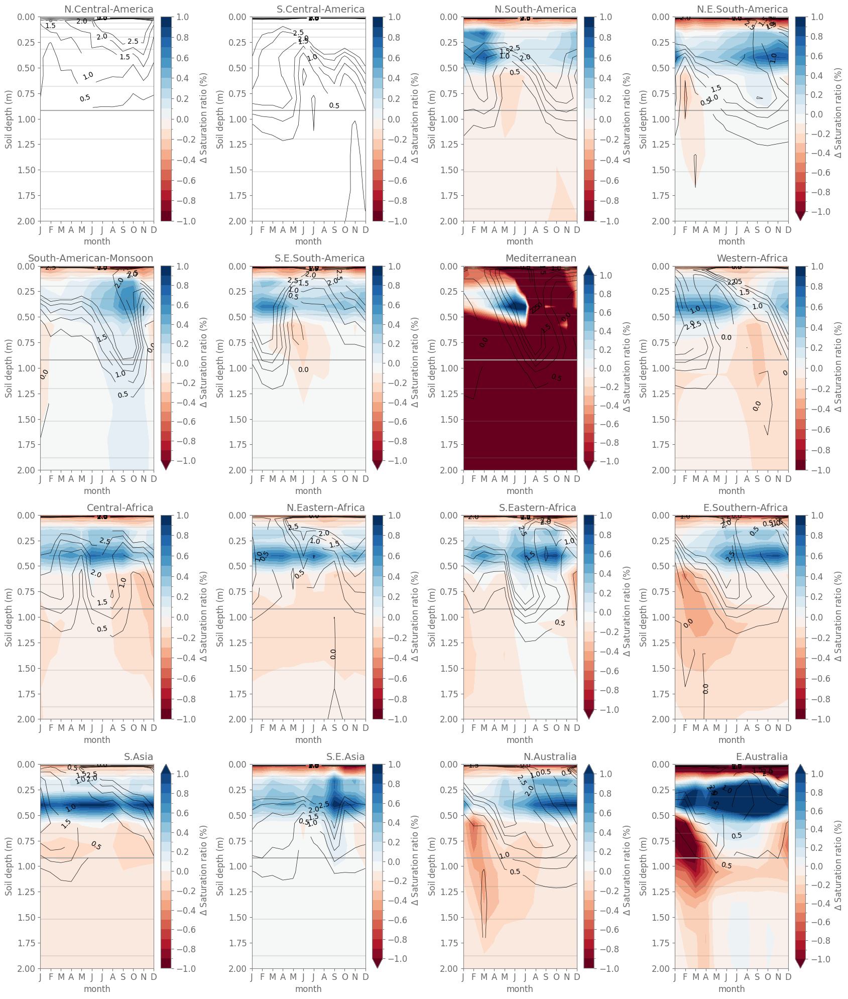

In [24]:
# prepare for plotting 
variable = 'satfrac'
# open regions dataset

if  isinstance(texture_mask,bool):
    texure_name = ''
else: 
    texture_name = texture_mask.name

print(texture_name)
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.'+texture_name+'.delta_change_rel.nc')[variable]
da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()

variable = 'QROOTSINK'
da_ctl_region_qroot = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.ctl.nc')[variable]
da_ctl_region_qroot_seasmean = da_ctl_region_qroot.groupby('time.month').mean().squeeze()



fig, axes = plt.subplots(4,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    
    levels =np.arange(-1,1.1,0.1)
    ticks =np.arange(-1,1.2,0.2)
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' $\Delta$ Saturation ratio (%)', 'ticks':ticks}, levels= levels)

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

#### Absolute change

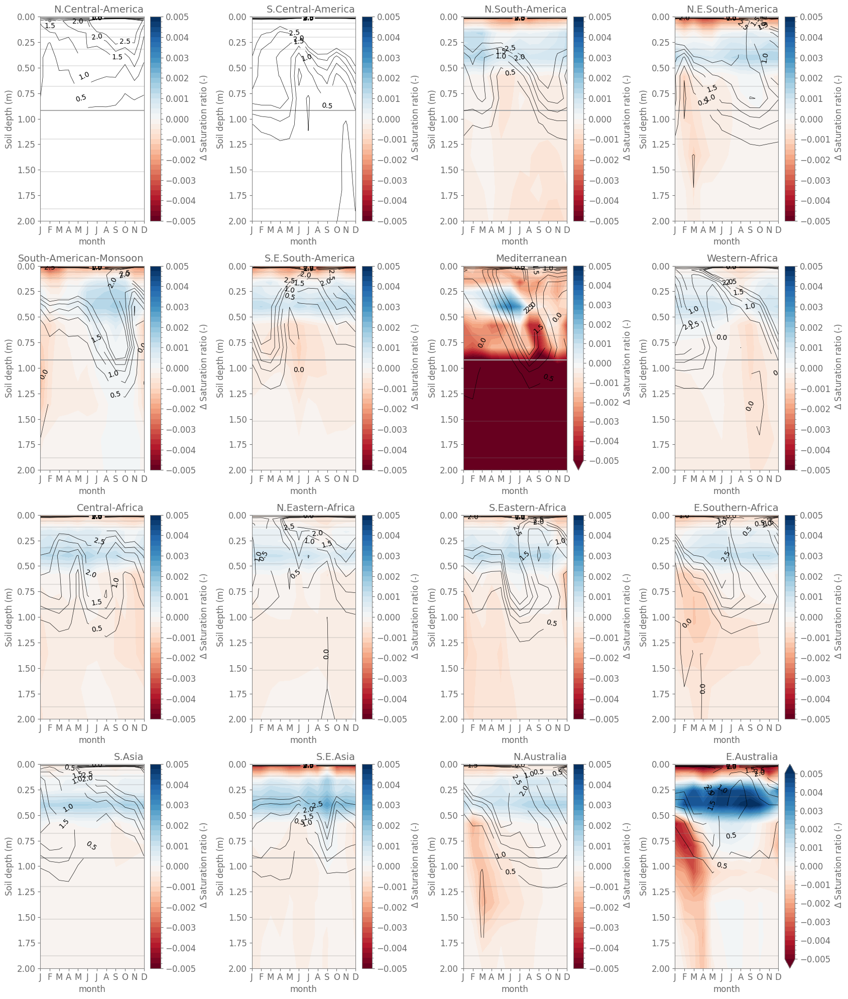

In [25]:
# prepare for plotting 
variable = 'satfrac'


if  isinstance(texture_mask,bool):
    texure_name = ''
else: 
    texture_name = texture_mask.name
    
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.'+texture_name+'.delta_change.nc')[variable]
da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()


fig, axes = plt.subplots(4,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    
    levels =np.arange(-0.005,0.00525,0.00025)
    ticks =np.arange(-0.005,0.006,0.001)
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' $\Delta$ Saturation ratio (-)', 'ticks':ticks}, levels= levels)

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

### volumetric soil moisture

#### relative change

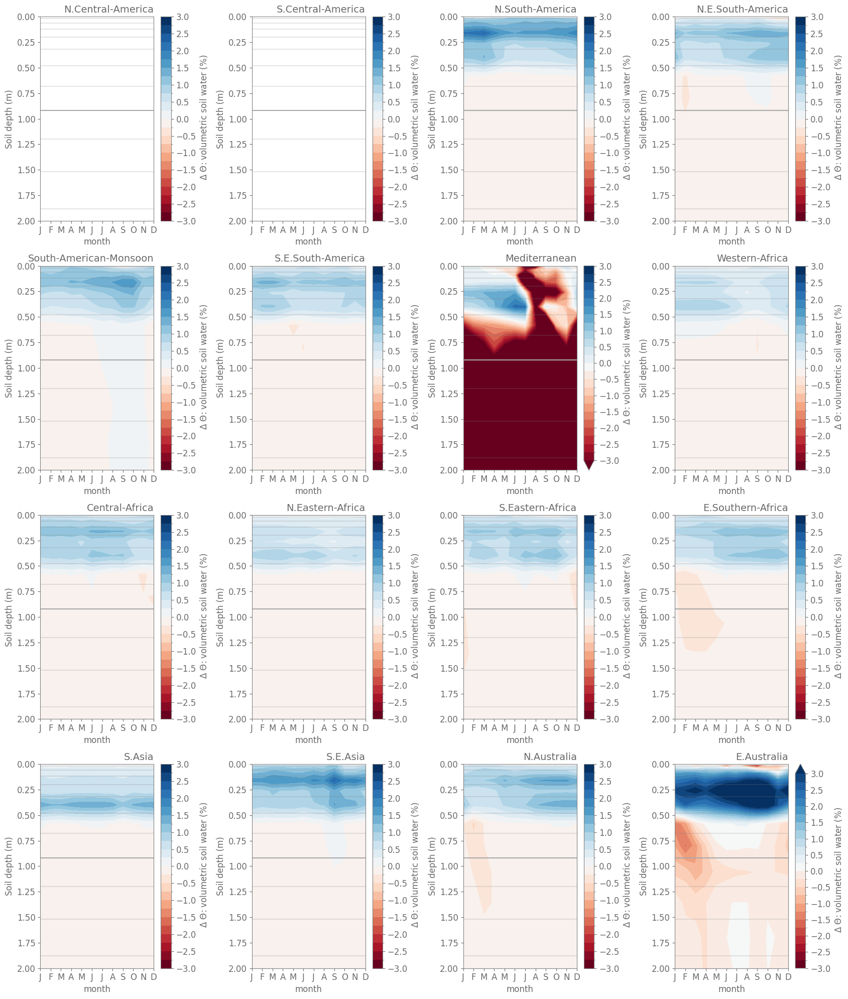

In [21]:
# prepare for plotting 
variable = 'H2OSOI'


if  isinstance(texture_mask,bool):
    texure_name = ''
else: 
    texture_name = texture_mask.name
    
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.'+texture_name+'.delta_change_rel.nc')[variable]
da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()

fig, axes = plt.subplots(4,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    
    levels =np.arange(-3,3.25,0.25)
    ticks =np.arange(-3,3.5,0.5)
    
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' $\Delta$ $\Theta$: volumetric soil water (%)', 'ticks':ticks}, levels= levels)

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

#### absolute change

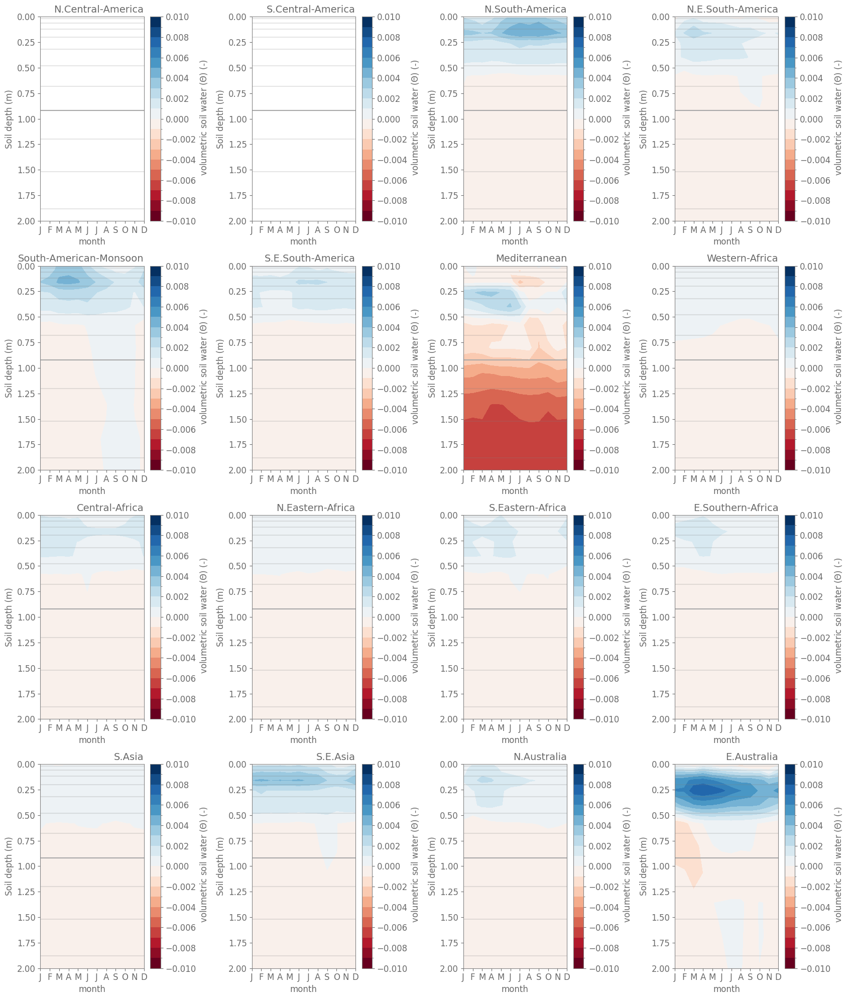

In [22]:
# prepare for plotting 
variable = 'H2OSOI'

if  isinstance(texture_mask,bool):
    texure_name = ''
else: 
    texture_name = texture_mask.name
    
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.'+texture_name+'.delta_change.nc')[variable]
da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()

fig, axes = plt.subplots(4,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev
    
    levels =np.arange(-0.01,0.011,0.001)
    ticks =np.arange(-0.01,0.012,0.002)
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' volumetric soil water ($\Theta$) (-)', 'ticks':ticks}, levels= levels)
    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
      
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

## Clay soils



### saturated fraction

In [45]:
texture_mask = da_clay_mask
region_ids = regions_sand_clay

pft_int = pft_list_crops[0]

flag_plot_rootuptake = False

figsize = (17,20)

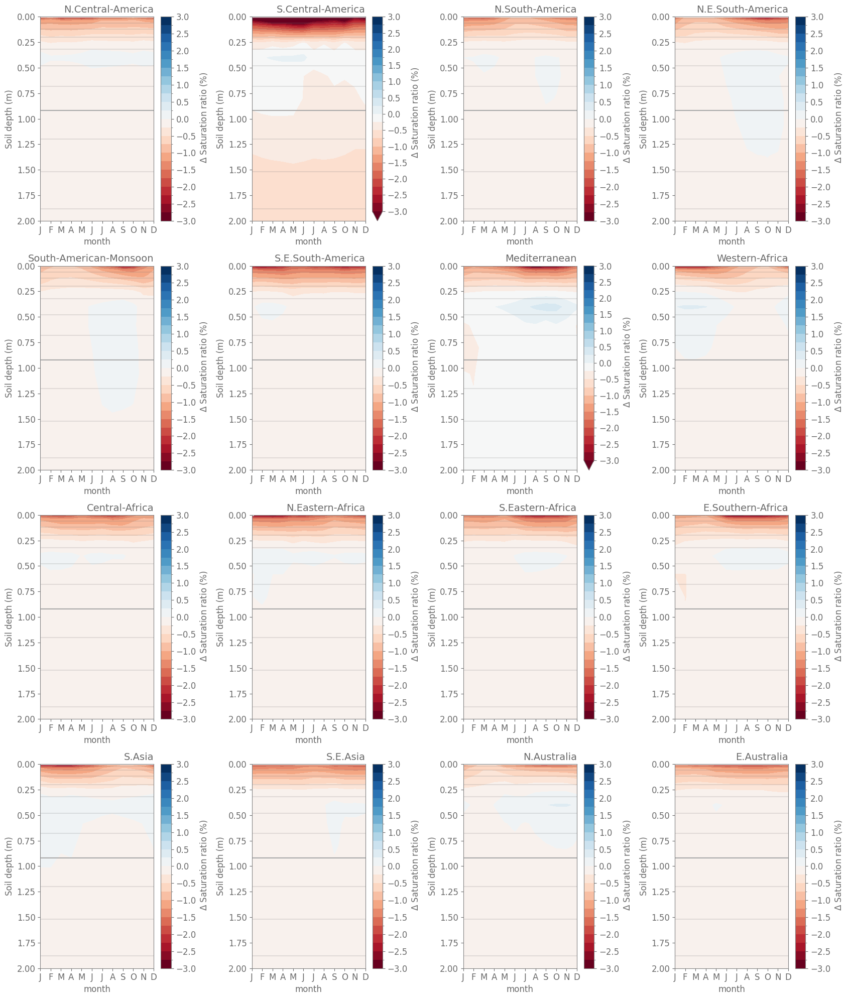

In [46]:
# prepare for plotting 
variable = 'satfrac'
# open regions dataset

if  isinstance(texture_mask,bool):
    texure_name = ''
else: 
    texture_name = texture_mask.name
    
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.'+texture_name+'.delta_change_rel.nc')[variable]
da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()

variable = 'QROOTSINK'
da_ctl_region_qroot = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.ctl.nc')[variable]
da_ctl_region_qroot_seasmean = da_ctl_region_qroot.groupby('time.month').mean().squeeze()



fig, axes = plt.subplots(4,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    
    levels =np.arange(-3,3.25,0.25)
    ticks =np.arange(-3,3.5,0.5)
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' $\Delta$ Saturation ratio (%)', 'ticks':ticks}, levels= levels)

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

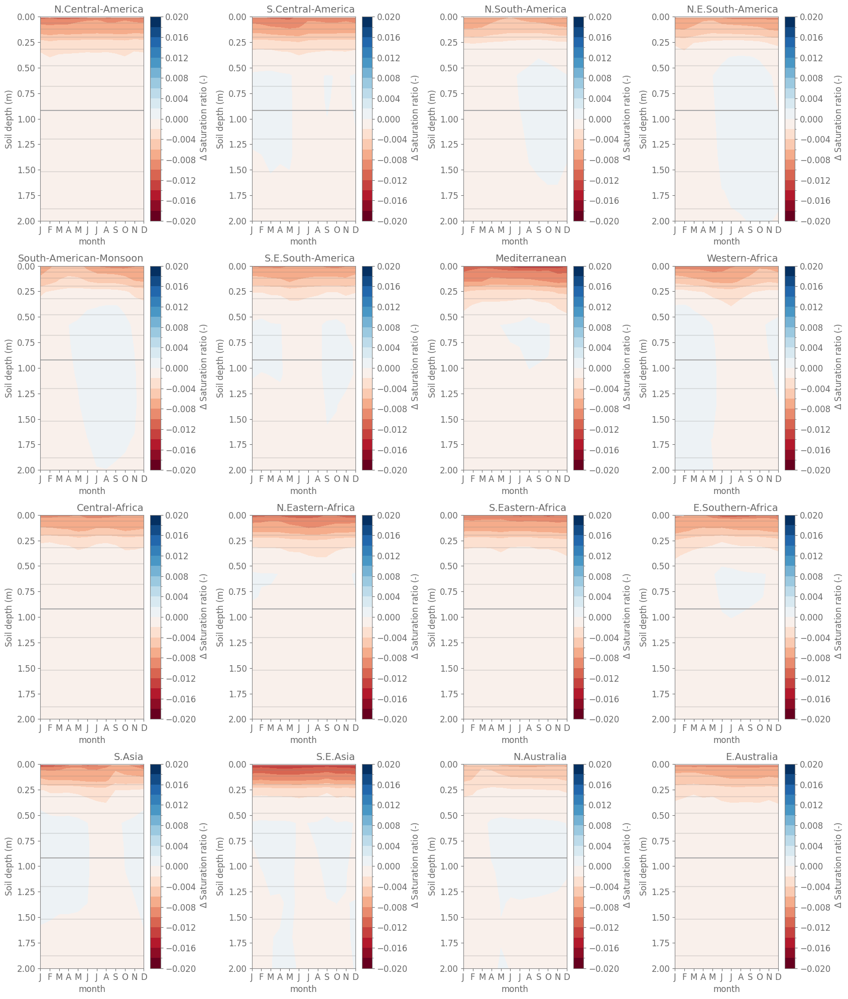

In [51]:
# prepare for plotting 
variable = 'satfrac'


if  isinstance(texture_mask,bool):
    texure_name = ''
else: 
    texture_name = texture_mask.name
    
da_regions = xr.open_dataset(procdir+'/postprocessing/pft_gridding/regional_means.'+variable+'.'+str(pft_int)+'.'+texture_name+'.delta_change.nc')[variable]
da_regions_seasmean = da_regions.groupby('time.month').mean().squeeze()


fig, axes = plt.subplots(4,4,figsize=figsize)
axes = axes.flatten()

for i, region in enumerate(region_ids):
    
    ax = axes[i]

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

    
    levels =np.arange(-0.02,0.022,0.002)
    ticks =np.arange(-0.02,0.024,0.004)
    
    da_regions_seasmean.sel(region=region).plot.contourf(ax=ax, x='month', y='levsoi', cmap='RdBu', cbar_kwargs={'label':' $\Delta$ Saturation ratio (-)', 'ticks':ticks}, levels= levels)

    ax.hlines(levsoi_depth, 1,12, color='grey', alpha=0.2)
    ax.hlines(levsoi_depth[7],1,12, color='darkgrey', alpha=1)
    
    # plot QROOT
    if flag_plot_rootuptake: 
        levels_qroot = np.arange(0,2.75e-6,0.5e-6)
        cs = da_ctl_region_qroot_seasmean.sel(region=region).plot.contour(ax=ax,  x='month', y='levsoi', label='Root water uptake', levels=levels_qroot, linewidths=0.5, colors='k') #, colors='dimgray')
        ax.clabel(cs, inline=True, fontsize=10)

    ax.set_ylim([plotting_depth,0])
    ax.set_title(region_name, loc='right')
    ax.set_title(' ', loc='center')
    ax.set_ylabel('Soil depth (m)')
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(['J', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O', 'N', 'D'])
    fig.tight_layout()

## Look at infiltration for cropland

In [14]:
variable = 'QINFL'
pft_list = pft_list_crops


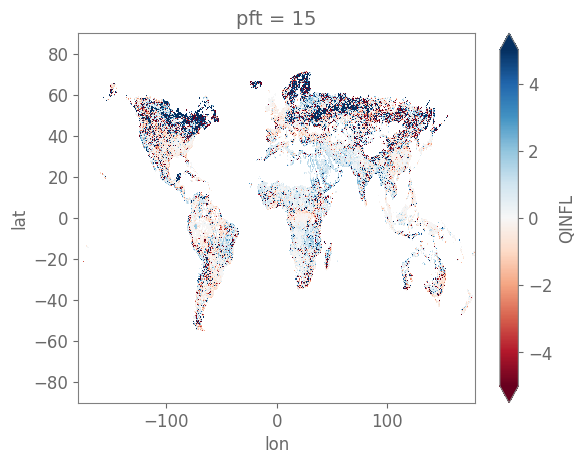

In [9]:
ds_delta, ds_delta_rel = calc_delta_and_rel_pft(case_ctl, case_scen, variable, pft_list)

ds_delta_rel.mean('time').sel(pft=pft_list[0]).plot(vmin=-5,vmax=5, cmap='RdBu')



#### 

In [ ]:
# calculate delta and relative delta for pft output gridded variables after calculating regional means (avoiding inf values)
def calc_region_seasmean_delta_and_rel_pft(case_ctl,case_scen,variable,pft_list, region_mask, region_ids, texture_mask=False):

    list_da_pft = []
    list_da_pft_scen = []

    for pft_int in pft_list: 

        list_da_pft.append(load_da_gridded_pft(variable, pft_int, case_ctl).rename(variable))
        list_da_pft_scen.append(load_da_gridded_pft(variable, pft_int, case_scen).rename(variable))

    ds_ctl = xr.concat(list_da_pft, dim='ivt_str').rename({'ivt_str':'pft'})
    ds_ctl['pft'] = pft_list

    ds_scen = xr.concat(list_da_pft_scen, dim='ivt_str').rename({'ivt_str':'pft'})
    ds_scen['pft'] = pft_list

    # texture mask is provided
    if not isinstance(texture_mask,bool):     
        ds_ctl = ds_ctl.where(texture_mask)
        ds_scen = ds_scen.where(texture_mask)

    d_delta = {}
    d_delta_rel= {}

    for i,region in enumerate(region_ids):

        region_name = regionmask.defined_regions.ar6.land[region].name
        region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev

        print('processing: '+ region_name)


        d_delta[region] = ds_scen.groupby('time.month').mean().where(mask_regions==region).mean(dim=('lat','lon')) - ds_ctl.groupby('time.month').mean().where(mask_regions==region).mean(dim=('lat','lon'))
        d_delta_rel[region] = (d_delta[region]/ ds_ctl.groupby('time.month').mean().where(mask_regions==region).mean(dim=('lat','lon')))*100
    return d_delta, d_delta_rel

In [11]:
d_delta_region, d_delta_rel_region = calc_region_seasmean_delta_and_rel_pft(case_ctl, case_scen, variable, pft_list, mask_regions, region_ids)

processing: W.North-America
processing: C.North-America
processing: E.North-America
processing: N.Central-America
processing: S.Central-America
processing: Caribbean
processing: N.W.South-America
processing: N.South-America
processing: N.E.South-America
processing: South-American-Monsoon
processing: S.W.South-America
processing: S.E.South-America
processing: S.South-America
processing: West&Central-Europe
processing: E.Europe
processing: Mediterranean
processing: Sahara
processing: Western-Africa
processing: Central-Africa
processing: N.Eastern-Africa
processing: S.Eastern-Africa
processing: W.Southern-Africa
processing: E.Southern-Africa
processing: Madagascar
processing: W.C.Asia
processing: E.C.Asia
processing: Tibetan-Plateau
processing: E.Asia
processing: Arabian-Peninsula
processing: S.Asia
processing: S.E.Asia
processing: N.Australia
processing: C.Australia
processing: E.Australia
processing: S.Australia
processing: New-Zealand


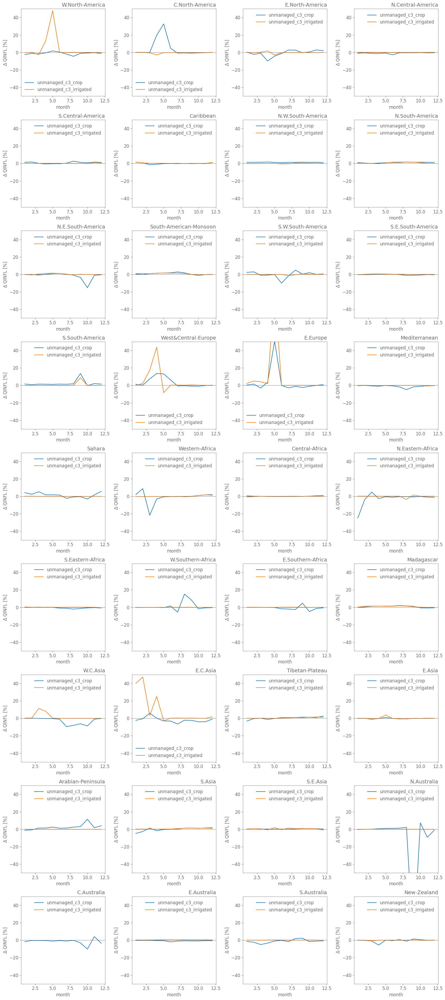

In [14]:
fig, axes = plt.subplots(9,4,figsize=figsize)
axes = axes.flatten()

for i,region in enumerate(region_ids):

    region_name = regionmask.defined_regions.ar6.land[region].name
    region_abbrev = regionmask.defined_regions.ar6.land[region].abbrev
    
    ax = axes[i]
    
    for pft_int in pft_list: 
        d_delta_rel_region[region].sel(pft=pft_int).plot(ax=ax, label=ivt_int2str(pft_int))
        ax.set_ylim([-50,50])
        ax.set_title(region_name, loc='right')
        ax.set_title('  ', loc='center')

        ax.legend(frameon=False)
        ax.axhline(y=0, color='dimgray', linewidth=0.5)
        ax.set_ylabel('$\Delta$ '+variable +' [%] ')
fig.tight_layout()